In [1]:
import matplotlib.pyplot as plt 
from glob import glob
import numpy as np

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Dropout,BatchNormalization

import tensorflow.keras.utils as np_utils
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
#import tensorflow_addons as tfa
from keras.models import Model

from matplotlib.colors import ListedColormap
import matplotlib as mpl
#from keras.utils.training_utils import multi_gpu_model


from sklearn.metrics import confusion_matrix,classification_report
import seaborn as sns
import os
import math
import pandas as pd


import pickle
from joblib import dump, load

2023-08-30 10:35:14.459236: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-30 10:35:14.519041: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# 1.GPU 메모리 자동 증가 설정

In [2]:
# GPU 메모리 자동 증가 설정
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    for gpu in gpus:
        tf.config.experimental.set_memory_growth(gpu, True)

# 2.Loading data
## changing merger∆ to mergerO

In [3]:
%%time
grids=500
base='/tf/dataset/'
data = np.load(base+str(grids)+'data.npz')
name_train = data['name_train']
X_train = data['X_train']
y_train = data['y_train']
y_train[y_train==2]=1

name_val = data['name_val']
X_val = data['X_val']
y_val = data['y_val']
y_val[y_val==2]=1

name_test = data['name_test']
X_test = data['X_test']
y_test = data['y_test']
y_test[y_test==2]=1

CPU times: user 873 ms, sys: 243 ms, total: 1.12 s
Wall time: 1.12 s


# 3.Reshaping & Normalization

In [4]:
%%time
#num_pixels = X_train.shape[1] * X_train.shape[2]
print(X_train.shape)
X_train = X_train.reshape((X_train.shape[0],grids,grids,1)).astype('float32')
X_test = X_test.reshape((X_test.shape[0],grids,grids,1)).astype('float32')
X_val = X_val.reshape((X_val.shape[0],grids,grids,1)).astype('float32')
print(X_train.shape)
#Normalization                          
maxvalue=X_train[X_train>0].max()

X_train = X_train / maxvalue
X_train[np.isnan(X_train)==True]=0
X_train[np.isinf(X_train)==True]=0

X_test = X_test / maxvalue
X_test[np.isnan(X_test)==True]=0
X_test[np.isinf(X_test)==True]=0

X_val = X_val / maxvalue
X_val[np.isnan(X_val)==True]=0
X_val[np.isinf(X_val)==True]=0

(252, 500, 500)
(252, 500, 500, 1)
CPU times: user 403 ms, sys: 220 ms, total: 623 ms
Wall time: 618 ms


# 4. one-hot encoding outputs

In [5]:
%%time
y_train = np_utils.to_categorical(y_train)
y_test = np_utils.to_categorical(y_test)
y_val = np_utils.to_categorical(y_val)
num_classes = y_test.shape[1]

CPU times: user 118 µs, sys: 175 µs, total: 293 µs
Wall time: 213 µs


# 5. Model building

In [6]:
strategy = tf.distribute.MirroredStrategy()
Droprate=0.2
def baseline_model():
# create model
    model = Sequential()
    model.add(Conv2D(16, (5, 5), input_shape=(grids,grids, 1),strides=(1, 1), activation='relu',padding='same'))
    
    model.add(MaxPooling2D())
    model.add(Dropout(Droprate))
    
    model.add(Conv2D(32, (3, 3), activation='relu',strides=(1, 1),padding='same'))
    model.add(MaxPooling2D())
    model.add(Dropout(Droprate))
    
    model.add(Conv2D(32, (3, 3), activation='relu',strides=(1, 1),padding='same'))
    model.add(MaxPooling2D())
    model.add(Dropout(Droprate))
    
    model.add(Conv2D(32, (3, 3), activation='relu',strides=(1, 1),padding='same'))
    model.add(MaxPooling2D())
    model.add(Dropout(Droprate))


    
    model.add(Flatten())
    model.add(Dense(128,activation='relu'))
    model.add(Dense(num_classes,activation='softmax'))

    model.compile(loss='categorical_crossentropy',optimizer='adam', metrics=['accuracy'])    
    return model

# build the model
with strategy.scope():
    model=baseline_model()

INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:GPU:0', '/job:localhost/replica:0/task:0/device:GPU:1')


2023-08-30 10:35:19.587996: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46686 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:4b:00.0, compute capability: 8.6
2023-08-30 10:35:19.588691: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1639] Created device /job:localhost/replica:0/task:0/device:GPU:1 with 46686 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:b1:00.0, compute capability: 8.6


# Fitting Model

In [7]:
#start_time = tf.timestamp()

# Fit the model
history=model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=50, batch_size=32, verbose=2)
# Final evaluation of the model

save_dir = "/tf/Results/models/%i/Log/CNN/"%grids
model_name = '%i_C2_CV4_CC'%(grids)#_Drop_0.2
model_path = os.path.join(save_dir, model_name+'.h5')
model.save(model_path)
print('\n Saved trained model at %s ' % model_path)

scores = model.evaluate(X_test, y_test, verbose=0)
print("Baseline Error: %.2f%%" % (100-scores[1]*100))



# 실행 시간 계산
#end_time = tf.timestamp()
#execution_time = end_time - start_time
#print("Execution time: ", execution_time.numpy(), " seconds")

# history 객체를 저장
dump(history.history, '/tf/Results/histories/%i/Log/CNN/'%grids+model_name+'.joblib')

Epoch 1/50
INFO:tensorflow:Collective all_reduce tensors: 12 all_reduces, num_devices = 2, group_size = 2, implementation = CommunicationImplementation.NCCL, num_packs = 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Collective all_reduce tensors: 12 all_reduces, num_devices = 2, group_size = 2, implementation = CommunicationImplementation.NCCL, num_packs = 1
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/r

2023-08-30 10:35:21.930545: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential/dropout/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer
2023-08-30 10:35:23.718259: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-08-30 10:35:24.631463: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:432] Loaded cuDNN version 8600
2023-08-30 10:35:25.766576: I tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:606] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.
2023-08-30 10:35:27.588125: I tensorflow/compiler/xla/service/service.cc:168] XLA service 0x7f1e4e43e480 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2023-08-30 10:35:27.588176: I tensorflow/compiler/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A600

INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
INFO:tensorflow:Reduce to /job:localhost/replica:0/task:0/device:CPU:0 then broadcast to ('/job:localhost/replica:0/task:0/device:CPU:0',).
8/8 - 11s - loss: 1.8156 - accuracy: 0.4722 - val_loss: 0.6930 - val_accuracy: 0.6562 - 11s/epoch - 1s/step
Epoch 2/50
8/8 - 1s - loss: 0.6678 - accuracy: 0.6270 - val_loss: 0.6423 - val_accuracy: 0.6719 - 506ms/epoch - 63ms/step
Epoch 3/50
8/8 - 0s - loss: 0.6322 - accuracy: 0.6746 - val_loss: 0.6555 - val_accuracy: 0.6719 - 498ms/epoch - 62ms/step
Epoch 4/50
8/8 - 1s - loss: 0.6346 - accuracy: 0.6746 - val_loss: 0.6525 - val_accuracy: 0.6719 - 699ms/epoch - 87ms/step
Epoch 5/50
8/8 - 1s - loss: 0.6357 - accuracy: 0.6746 - val_loss: 0.6609 - val_accuracy: 0.6719 - 573ms/epoch - 72ms/step
Epoch 6/50
8/8 - 1s - loss: 0.6274 - accuracy: 0.6746 - val_loss: 0.6475 - val_accuracy: 0.6719 - 548ms/epoch - 69ms/step
Ep

/usr/local/lib/python3.8/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Baseline Error: 31.25%


['/tf/Results/histories/500/Log/CNN/500_C2_CV4_CC.joblib']

# Confusion Matrix

In [13]:
y_pred=model.predict(X_test)
confM=confusion_matrix(np.argmax(y_test,axis=1),np.argmax(y_pred,axis=1))#normalize=True
per_confM=confusion_matrix(np.argmax(y_test,axis=1),np.argmax(y_pred,axis=1),normalize='true')
#class_totals = np.sum(confM, axis=1)
#cm_norm = confM / class_totals[:, np.newaxis]
np.savez('/tf/Results/confusion/'+str(grids)+'/Log/CNN/'+model_name+'.npz', confusion=confM)

3/3 [==============================] - 0s 12ms/step


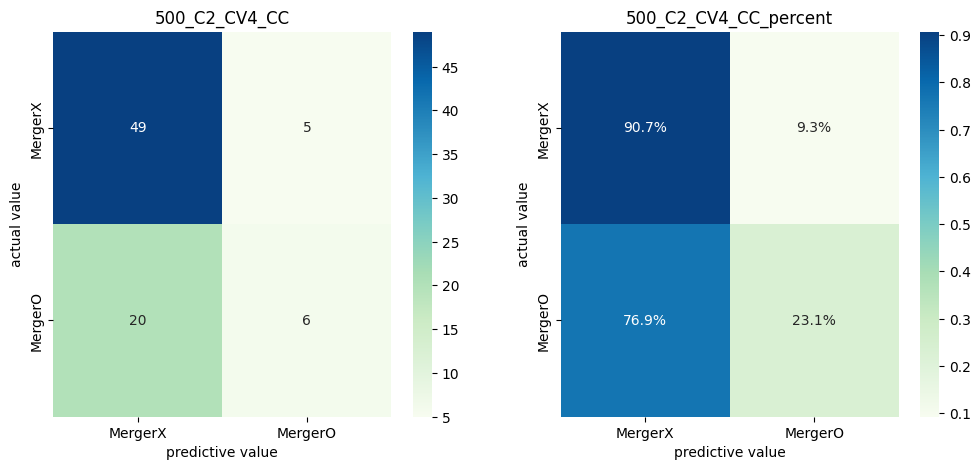

In [14]:
labels=['MergerX','MergerO']
#print(data)
# Drawing confusion matrix with seaborn
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
sns.heatmap(confM,annot=True,cmap='GnBu',xticklabels=labels, yticklabels=labels)
plt.xlabel('predictive value')
plt.ylabel('actual value')
plt.title(model_name)

plt.subplot(1,2,2)
sns.heatmap(per_confM,annot=True,fmt=".1%",cmap='GnBu',xticklabels=labels, yticklabels=labels)
plt.xlabel('predictive value')
plt.ylabel('actual value')
plt.title(model_name+'_percent')

plt.show()

## F1-score, accuray ... etc 

In [15]:
report=classification_report(np.argmax(y_test,axis=1),np.argmax(y_pred,axis=1),output_dict=True)

df=pd.DataFrame(report).transpose()
df.to_hdf('/tf/Results/confusion/'+str(grids)+'/Log/CNN/'+model_name+'.h5',key='Galaxy',mode='w')   
df## F1-score, accuray ... etc 

,precision,recall,f1-score,support
0,0.710145,0.907407,0.796748,54.0000
1,0.545455,0.230769,0.324324,26.0000
accuracy,0.687500,0.687500,0.687500,0.6875
macro avg,0.627800,0.569088,0.560536,80.0000
weighted avg,0.656621,0.687500,0.643210,80.0000


# 8. Drawing Hisotries(loss,accuracy) of the models

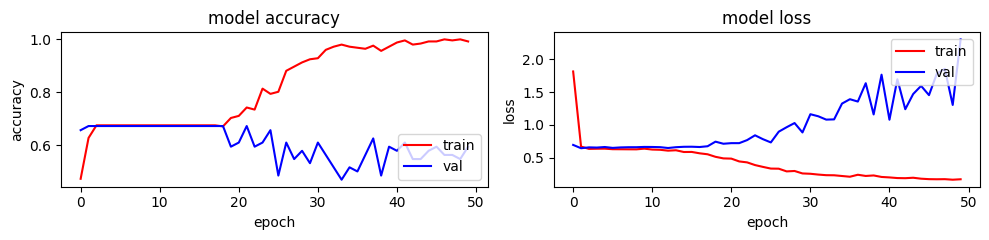

In [16]:
# plotting the metrics
fig = plt.figure(figsize=(10,2.5))

plt.subplot(1,2,1)
plt.plot(history.history['accuracy'],c='red')
plt.plot(history.history['val_accuracy'],c='blue')
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='lower right')

plt.subplot(1,2,2)
plt.plot(history.history['loss'],c='red')
plt.plot(history.history['val_loss'],c='blue')
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
#plt.ylim(0,1)
plt.legend(['train', 'val'], loc='upper right')

plt.tight_layout()
plt.show()

## 7-1) summary of model

In [17]:
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name: continue
    # summarize output shape
    #print(i, layer.name, layer.output.shape)
    filters, biases = layer.get_weights()
    print(i,layer.name, filters.shape)

0 conv2d (5, 5, 1, 16)
3 conv2d_1 (3, 3, 16, 32)
6 conv2d_2 (3, 3, 32, 32)
9 conv2d_3 (3, 3, 32, 32)


## 7-2) Drawing trained filters

In [ ]:
# 필터를 이미지로 변환하여 시각화합니다.
filters1, biases1 = model.layers[0].get_weights()
fig=plt.figure(figsize=(12, 12))
print(filters1.shape)
for i in range(filters1.shape[3]):
    ax=plt.subplot(4, 4, i + 1)
    plt.imshow(filters1[:, :, 0, i], cmap='gray')
    plt.axis('off')
    ax.get_xaxis().set_visible(False)
    ax.get_yaxis().set_visible(False)
plt.tight_layout()
plt.show()

In [ ]:
filters2, biases2 = model.layers[3].get_weights()
plt.figure(figsize=(15, 5))
for i in range(filters2.shape[3]):
    plt.subplot(8, 8, i + 1)
    plt.imshow(filters2[:, :, 0, i], cmap='gray')
    plt.axis('off')
    
plt.show()
plt.figure(figsize=(15, 5))
for i in range(filters2.shape[3]):
    plt.subplot(8, 8, i + 1)
    plt.imshow(filters2[:, :, 1, i], cmap='gray')
    plt.axis('off')
plt.show()

# 8. Finding FP & FN & TP & TN

In [18]:
trues,preds=np.argmax(y_test,axis=1),np.argmax(y_pred,axis=1)
# FP 샘플의 인덱스 추출 (간단한 방식)
fp_indices = [i for i, (true, pred) in enumerate(zip(trues, preds)) if true == 0 and pred == 1]
fn_indices = [i for i, (true, pred) in enumerate(zip(trues, preds)) if true == 1 and pred == 0]
tp_indices = [i for i, (true, pred) in enumerate(zip(trues, preds)) if true == 1 and pred == 1]
tn_indices = [i for i, (true, pred) in enumerate(zip(trues, preds)) if true == 0 and pred == 0]
print('FP :%i개, FN :%i개, TP :%i개, TN :%i개'%(len(fp_indices),len(fn_indices),len(tp_indices),len(tn_indices)))

FP :5개, FN :20개, TP :6개, TN :49개


In [19]:
def DrawingSample(fp_indices) :
    num_fp=len(fp_indices)
    Cycle = math.ceil(num_fp/8)
    X,Y=np.arange(grids),np.arange(grids)


    for k in np.arange(0,8*Cycle,8) :
        if (k == np.arange(0,8*Cycle,8)[-1]) and (num_fp%8!=0) :
            rest=num_fp-math.floor(num_fp/8)*8
            num_row=math.ceil(rest/2)
        else : num_row=4
            
        fig=plt.figure(figsize=(20,num_row*3))
            
        pair_id=np.array([1,2,3,4])
        odd_id=np.array([5,6,7,8])
        
        for i in range(num_fp)[k:k+8] :
            if i == num_fp : break
            if i % 2 == 0 : axes_id=pair_id
            elif i %2 == 1 : axes_id=odd_id
            ax=plt.subplot(num_row,8,axes_id[0])
            origin=data['X_test'][fp_indices[i]]
            ax.pcolormesh(X,Y,origin,shading='gouraud',cmap='gray_r',vmax=31,vmin=12)
            plt.title(name_test[fp_indices[i]])
            ax.set_aspect('equal')
            plt.axis('off')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            ax=plt.subplot(num_row,8,axes_id[1])
            mask=origin.copy()
            mask[mask<26]=np.nan
            ax.pcolormesh(X,Y,mask,shading='gouraud',cmap='gray_r',vmax=31,vmin=12)
            plt.title('mask')
            ax.set_aspect('equal')
            plt.axis('off')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            ## Discret_colormap
            bounds=list(np.arange(12,31,1))
            color=["black","brown","crimson","darkorange","orange","lightyellow","yellow","gold","darkgreen","green","lightgreen","lightblue","skyblue","cornflowerblue","slateblue","mediumslateblue","rebeccapurple","midnightblue"]
            smap=ListedColormap(color)
            norm=mpl.colors.BoundaryNorm(bounds,smap.N)

            ax=plt.subplot(num_row,8,axes_id[2])
            ax.pcolormesh(X,Y,origin,shading='gouraud',cmap=smap,norm=norm)    
            plt.title('discrete_colormap')
            ax.set_aspect('equal')
            plt.axis('off')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            ax=plt.subplot(num_row,8,axes_id[3])
            ax.pcolormesh(X,Y,mask,shading='gouraud',cmap=smap,norm=norm)    
            plt.title('mask')
            ax.set_aspect('equal')
            plt.axis('off')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            if i % 2 == 0 : pair_id=pair_id+8
            elif i %2 == 1 : odd_id=odd_id+8

        plt.tight_layout()
        plt.show()
    

## 8-1) Drawing FP : MergerX인데, MergerO로 분류된 은하    

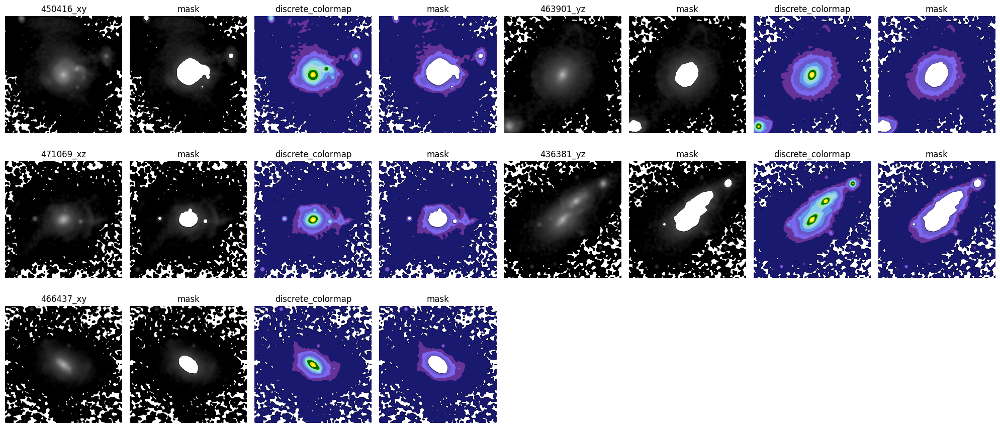

In [20]:
DrawingSample(fp_indices)

## 8-2) Drawing FN : MergerO인데, MergerX로 분류된 은하    

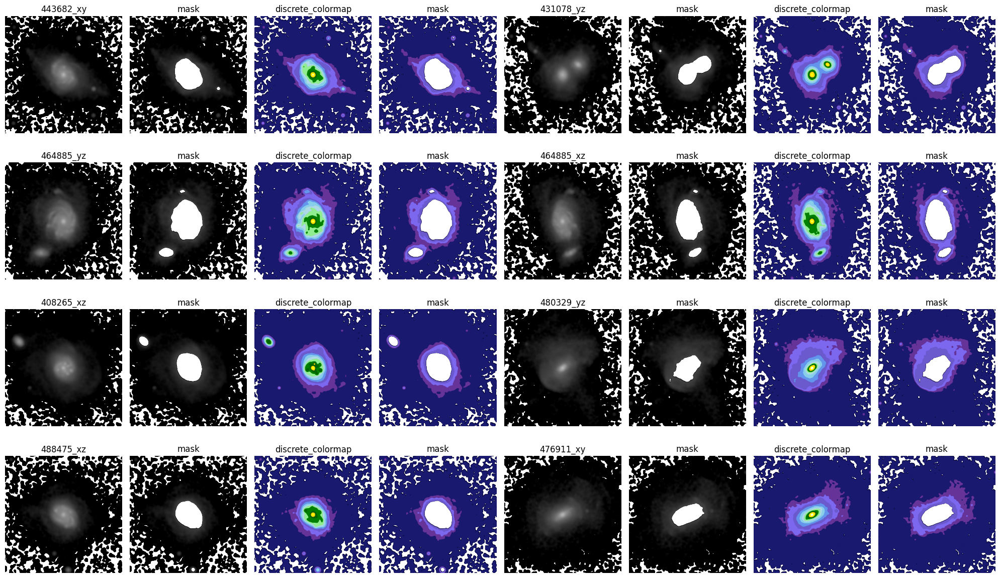

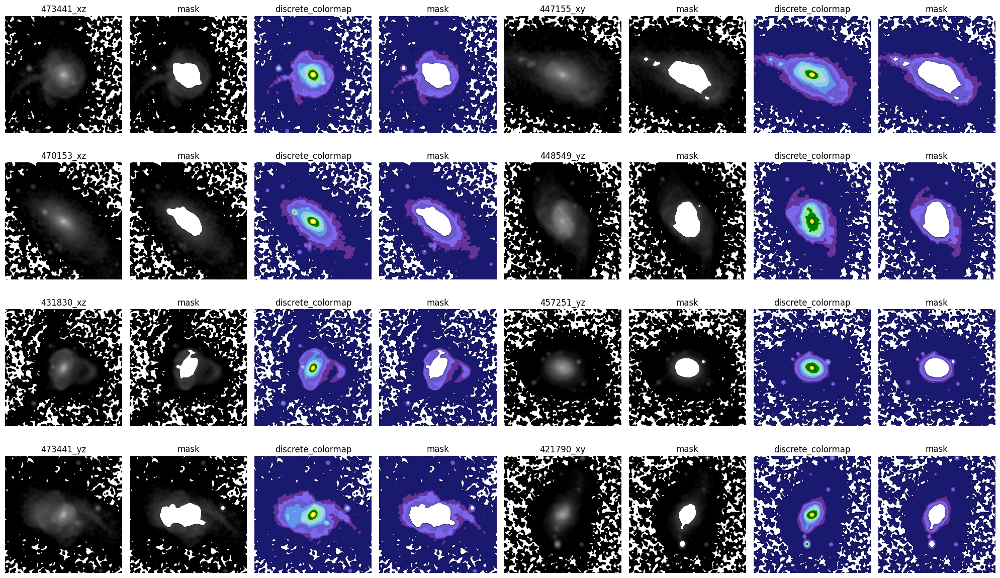

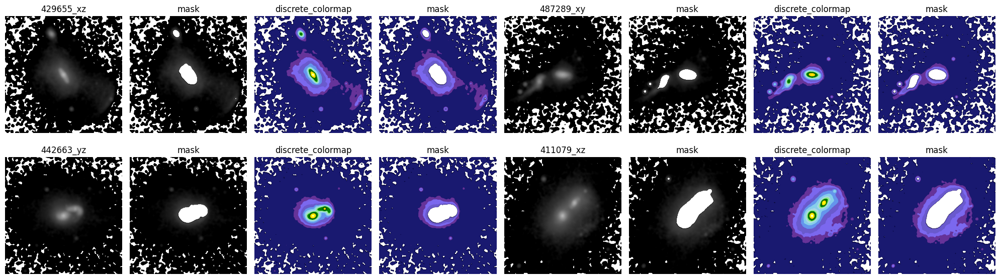

In [21]:
DrawingSample(fn_indices)

## 8-3) Drawing TP : MergerO인데, MergerO로 분류된 은하   

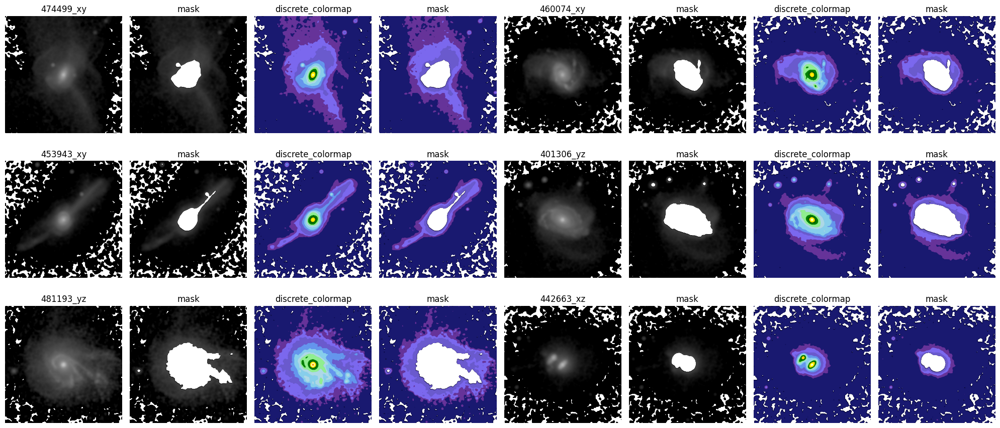

In [22]:
DrawingSample(tp_indices)

## 8-4) Drawing TN : MergerX인데, MergerX로 분류된 은하   

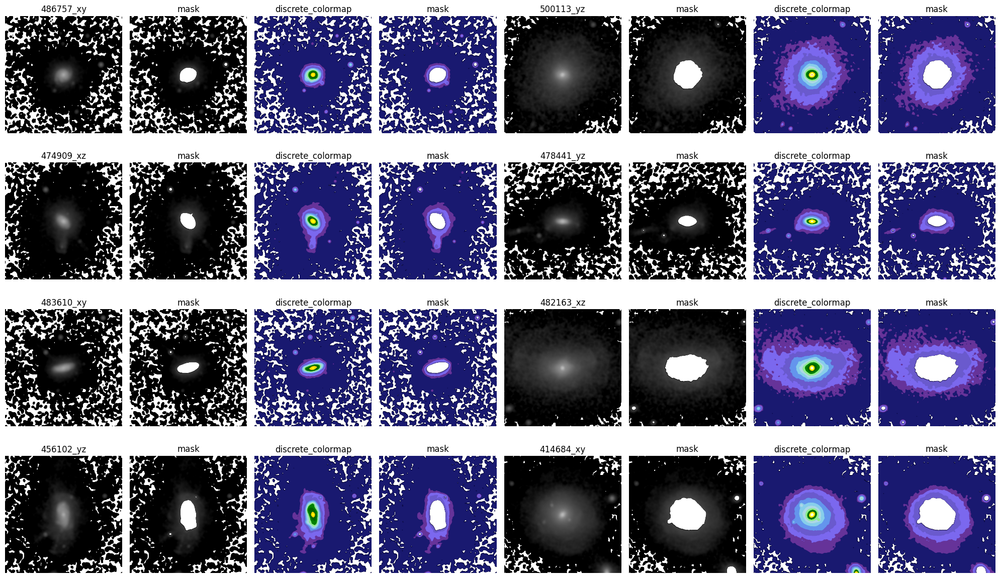

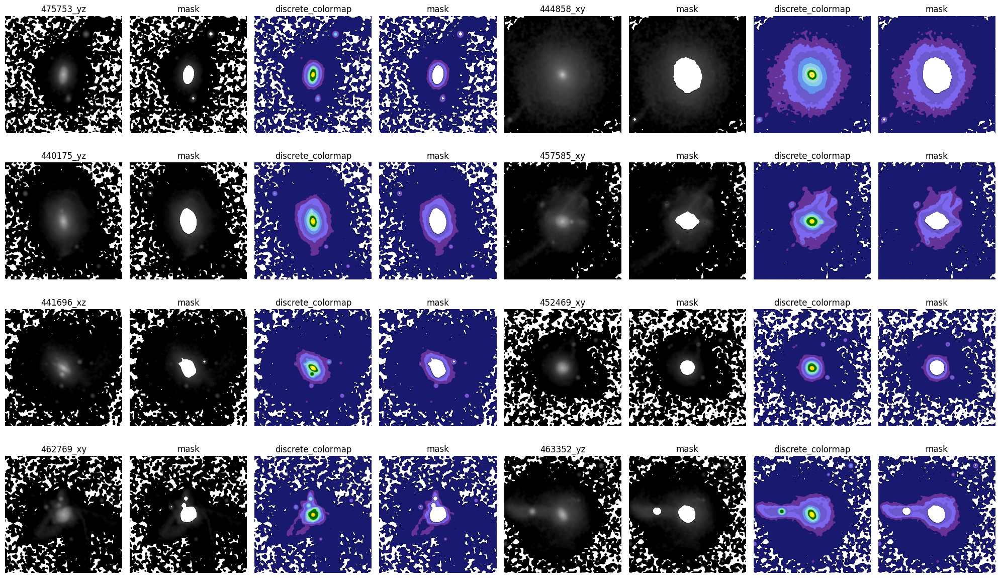

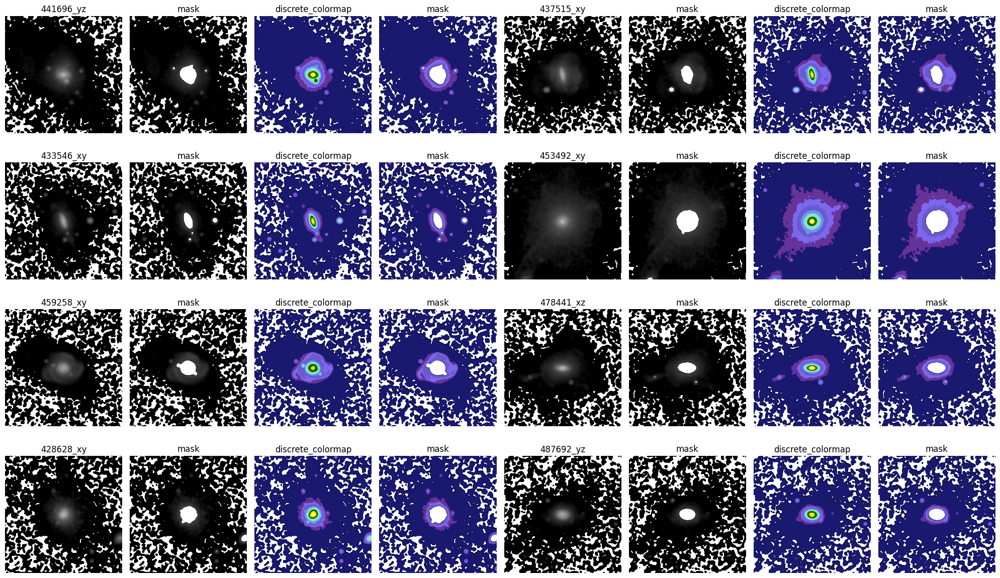

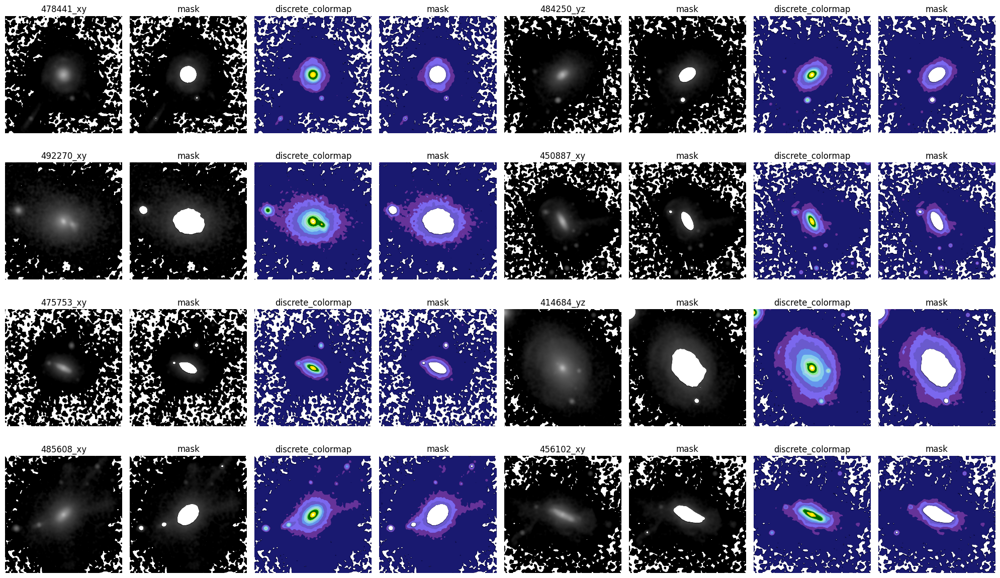

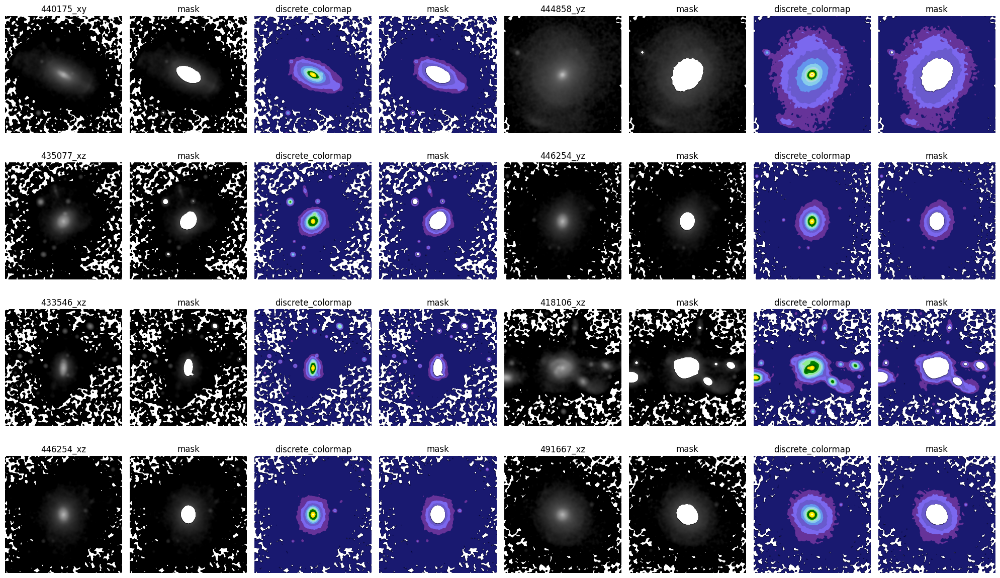

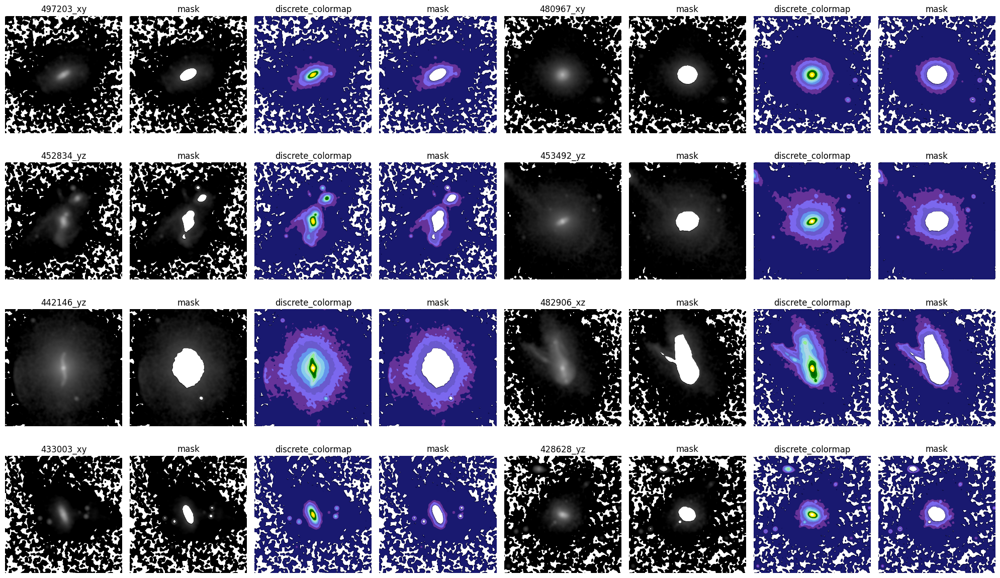

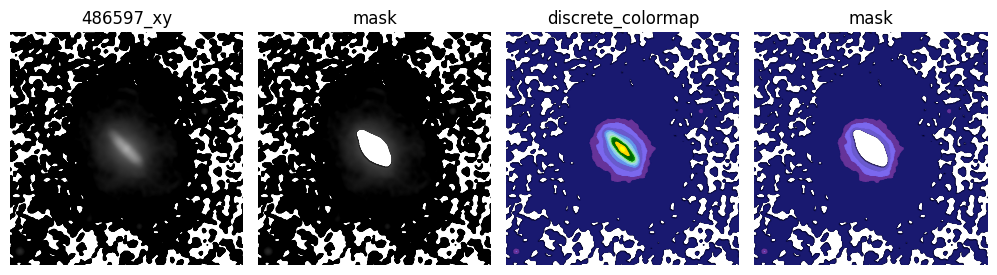

In [23]:
DrawingSample(tn_indices)

## 9) Drawing feature_maps

In [24]:
outlay=[model.layers[i].output for i in [0,3,6,9]]
outputs1=Model(inputs=model.inputs,outputs=outlay)

In [26]:
def FMAP(fp_indices,conv):
    for idx,i in enumerate(fp_indices) :
        if idx==2 : break
        test=np.expand_dims(X_test[i], axis=0)
        feature_maps=outputs1.predict(test)
        print(name_test[i])
        fig=plt.figure(figsize=(12,6))
        for i in range(32):
            ax=plt.subplot(4,8,i+1)
            plt.imshow(feature_maps[conv][0, :, :, i],cmap='gray_r')
            plt.axis('off')
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)
        plt.tight_layout()
        plt.show()

### 9-1) FP(Merger X -> Merger O)'s feature maps

1/1 [==============================] - 0s 22ms/step
450416_xy


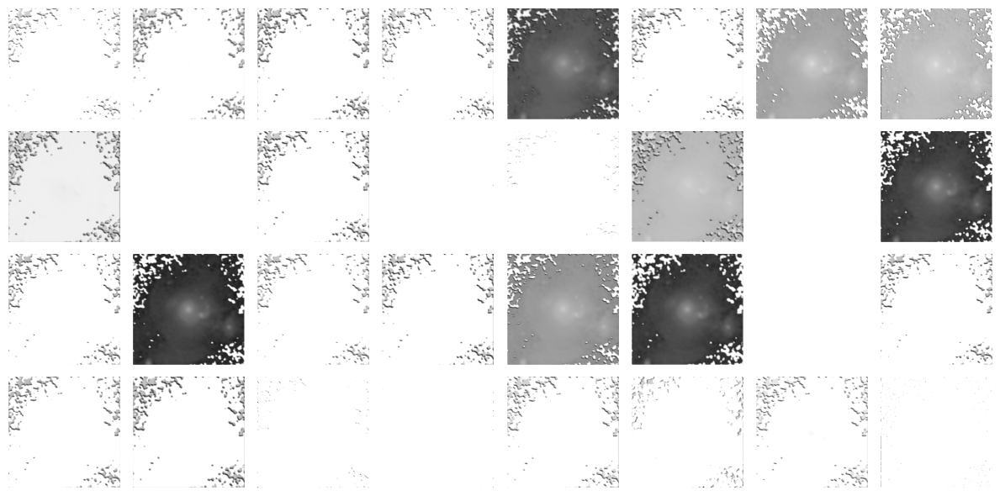

1/1 [==============================] - 0s 18ms/step
463901_yz


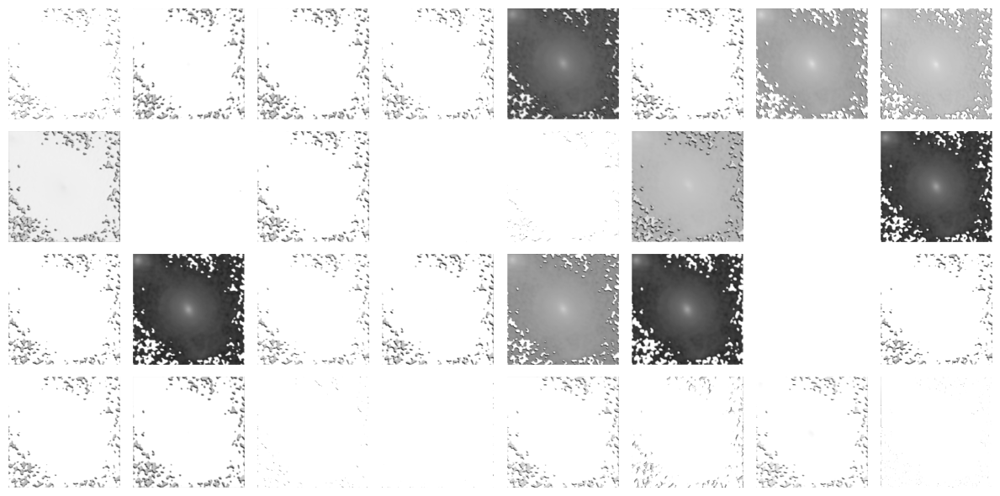

In [28]:
    FMAP(fp_indices,1)

### 9-2) TP(Merger O -> Merger O)'s feature maps

1/1 [==============================] - 0s 28ms/step
474499_xy


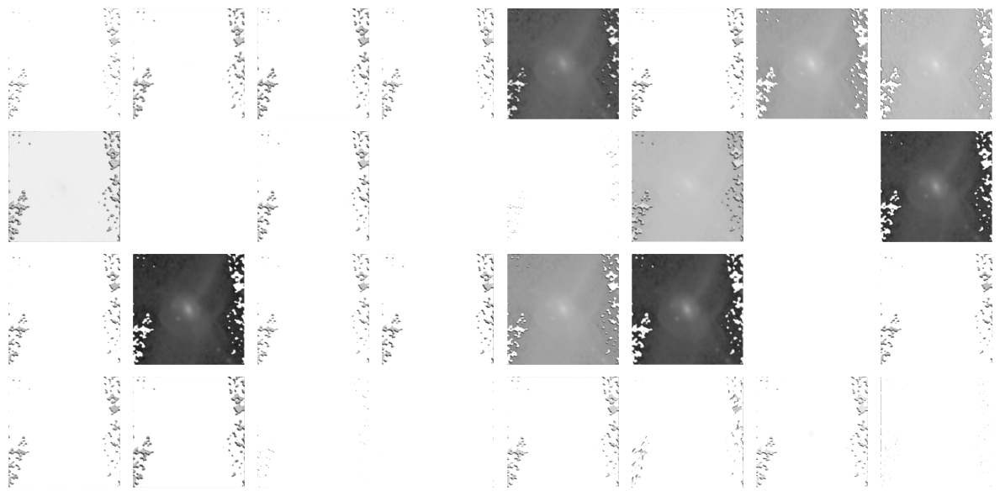

1/1 [==============================] - 0s 26ms/step
460074_xy


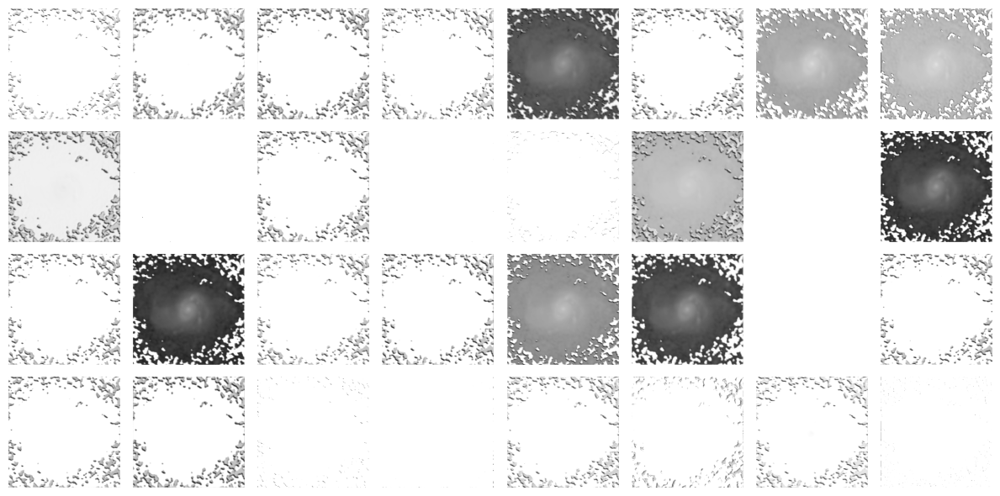

In [29]:
FMAP(tp_indices,1)